# Лабораторная работа № 2. Многомерная линейная регрессия

In [86]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [87]:
df = pd.read_csv("boston_house_prices.csv")
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


Всего 6 датасетов: исходный, с 2 признаками, с 7 признаками, четверть строк, треть строк, половина строк

In [88]:
df_2_feats = df[['CRIM', 'TAX', 'MEDV']]
df_2_feats.head()

,CRIM,TAX,MEDV
0,0.00632,296,24.0
1,0.02731,242,21.6
2,0.02729,242,34.7
3,0.03237,222,33.4
4,0.06905,222,36.2


In [89]:
df_7_feats = df[['CRIM', 'ZN', 'DIS', 'RAD', 'TAX', 'B', 'LSTAT', 'MEDV']]
df_7_feats.head()

,CRIM,ZN,DIS,RAD,TAX,B,LSTAT,MEDV
0,0.00632,18.0,4.0900,1,296,396.90,4.98,24.0
1,0.02731,0.0,4.9671,2,242,396.90,9.14,21.6
2,0.02729,0.0,4.9671,2,242,392.83,4.03,34.7
3,0.03237,0.0,6.0622,3,222,394.63,2.94,33.4
4,0.06905,0.0,6.0622,3,222,396.90,5.33,36.2


In [90]:
rows = df.shape[0]
df_fourth = df.sample(rows//4, random_state=1)
df_third = df.sample(rows//3, random_state=1)
df_half = df.sample(rows//2, random_state=1)

Графики

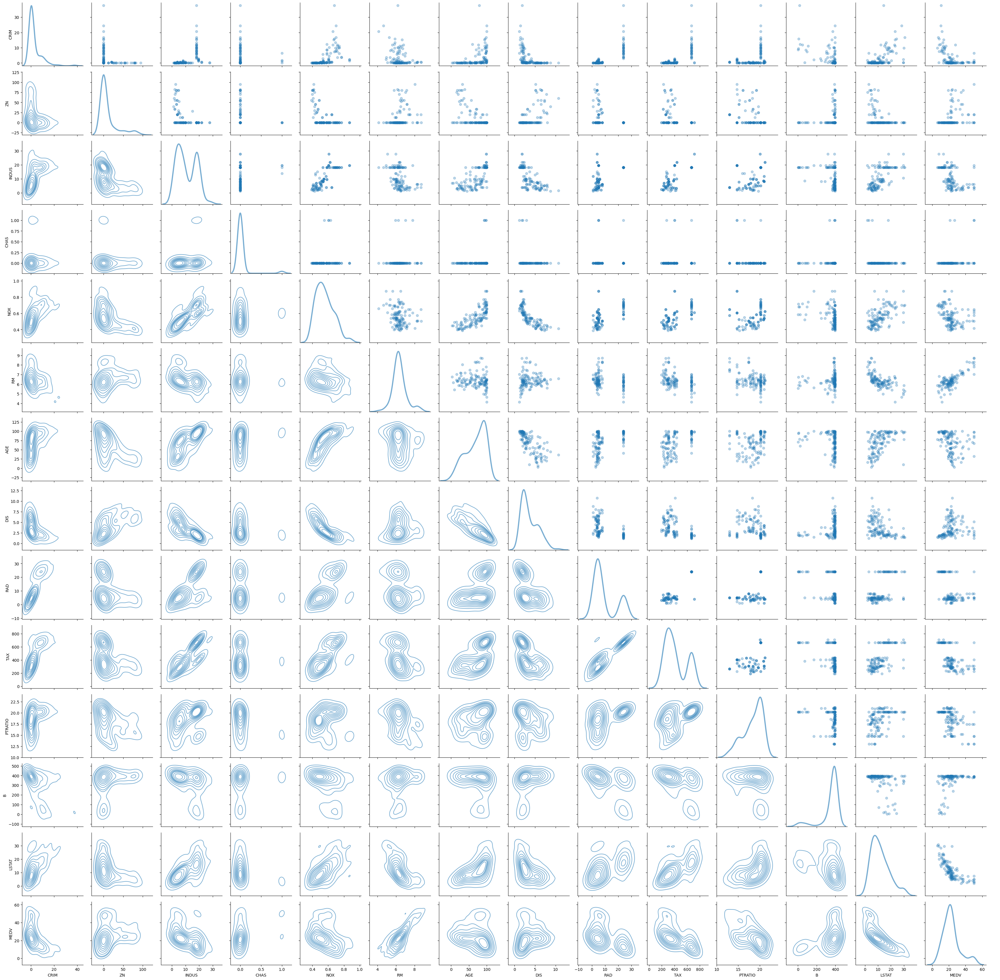

In [91]:
graph = sns.PairGrid(df_fourth, diag_sharey=False)
graph.map_lower(sns.kdeplot, alpha=0.6)
graph.map_upper(plt.scatter, alpha=0.3)
graph.map_diag(sns.kdeplot, lw=3, alpha=0.6, common_norm=False)
graph.add_legend()
plt.show()

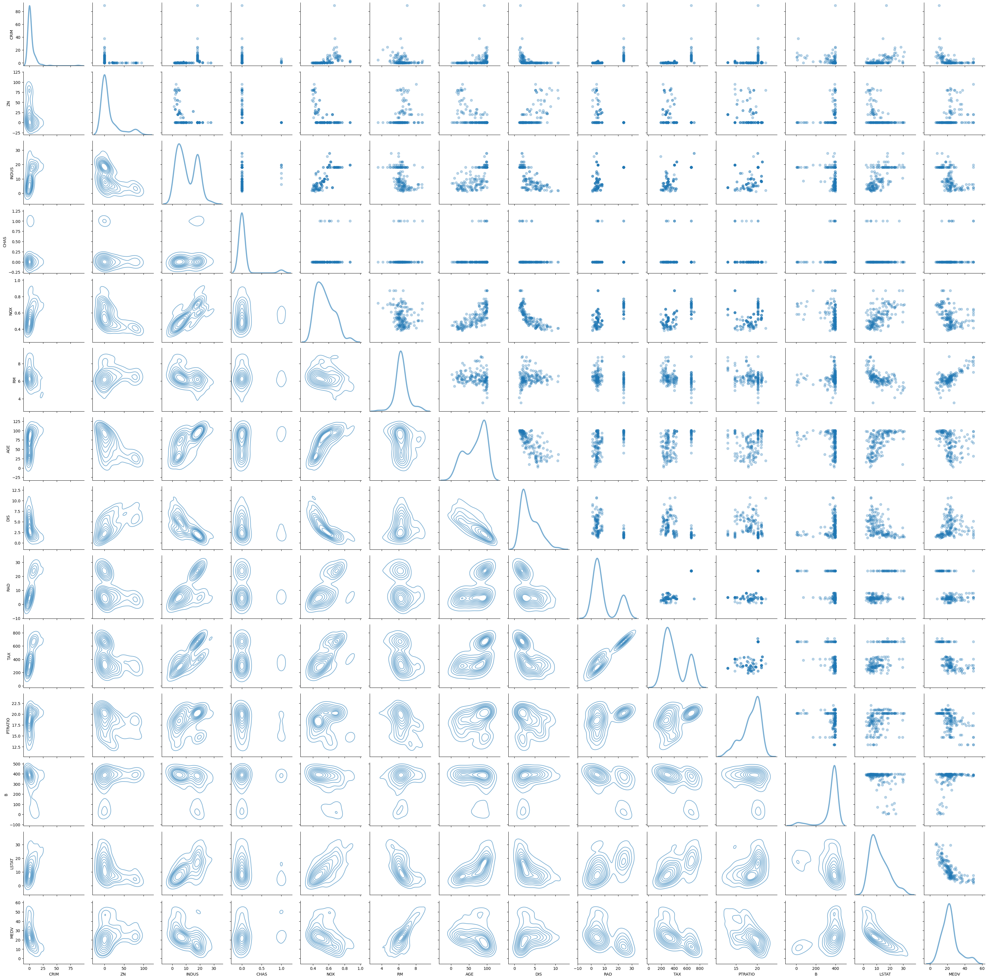

In [92]:
graph = sns.PairGrid(df_third, diag_sharey=False)
graph.map_lower(sns.kdeplot, alpha=0.6)
graph.map_upper(plt.scatter, alpha=0.3)
graph.map_diag(sns.kdeplot, lw=3, alpha=0.6, common_norm=False)
graph.add_legend()
plt.show()

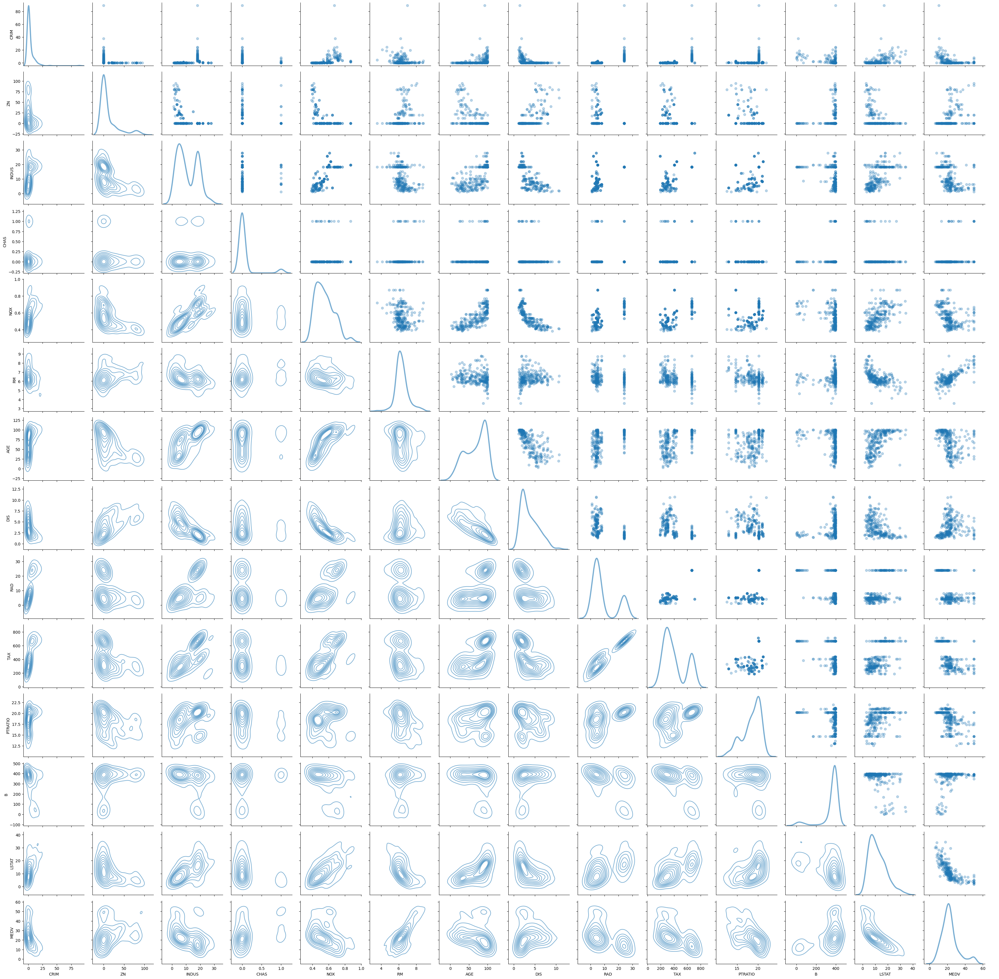

In [93]:
graph = sns.PairGrid(df_half, diag_sharey=False)
graph.map_lower(sns.kdeplot, alpha=0.6)
graph.map_upper(plt.scatter, alpha=0.3)
graph.map_diag(sns.kdeplot, lw=3, alpha=0.6, common_norm=False)
graph.add_legend()
plt.show()

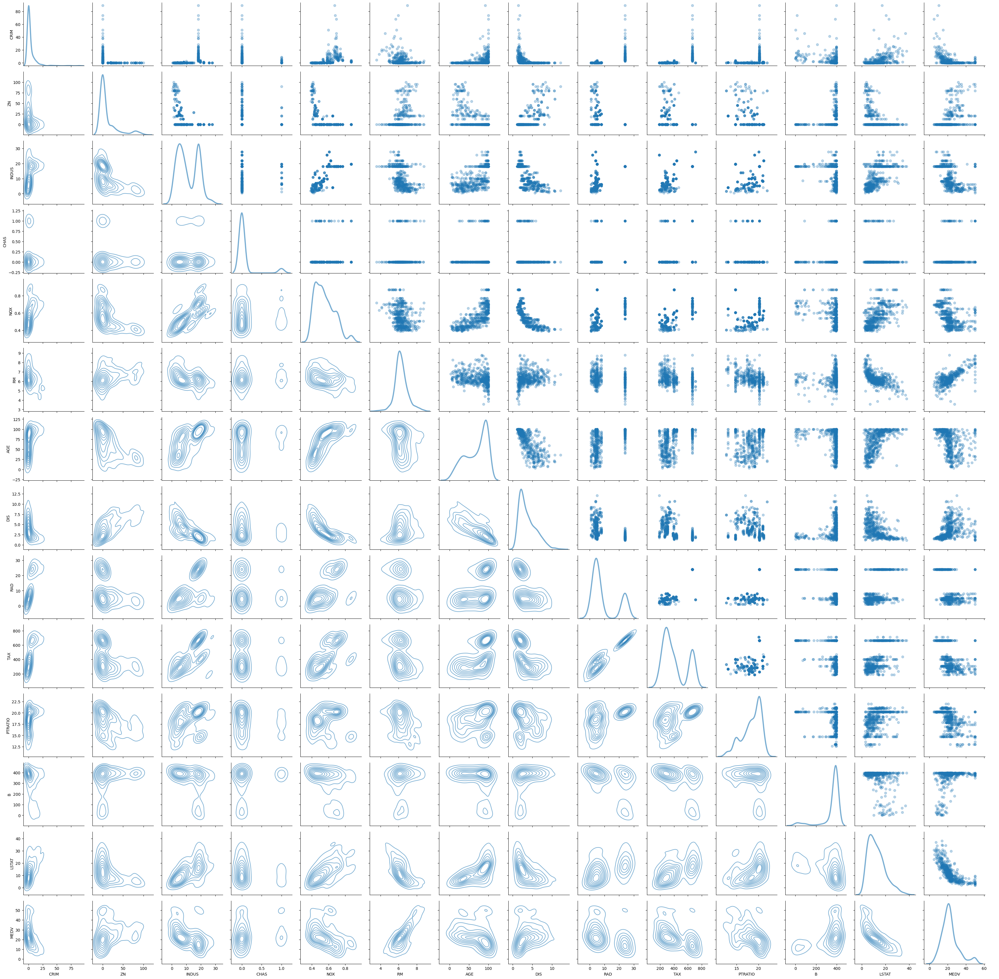

In [94]:
graph = sns.PairGrid(df, diag_sharey=False)
graph.map_lower(sns.kdeplot, alpha=0.6)
graph.map_upper(plt.scatter, alpha=0.3)
graph.map_diag(sns.kdeplot, lw=3, alpha=0.6, common_norm=False)
graph.add_legend()
plt.show()

Каждый датасет исследуем через линейную регрессию

In [95]:
train1, test1 = train_test_split(df_2_feats, test_size=0.2)

X_train1 = train1[['CRIM', 'TAX']]
Y_train1 = train1[['MEDV']]

X_test1 = test1[['CRIM', 'TAX']]
Y_test1 = test1[['MEDV']]

model1 = LinearRegression(fit_intercept=True)

model1.fit(X_train1, Y_train1)

Y_pred1 = model1.predict(X_test1)

In [96]:
train2, test2 = train_test_split(df_7_feats, test_size=0.2)

X_train2 = train2[['CRIM', 'ZN', 'DIS', 'RAD', 'TAX', 'B', 'LSTAT']]
Y_train2 = train2[['MEDV']]

X_test2 = test2[['CRIM', 'ZN', 'DIS', 'RAD', 'TAX', 'B', 'LSTAT']]
Y_test2 = test2[['MEDV']]

model2 = LinearRegression(fit_intercept=True)

model2.fit(X_train2, Y_train2)

Y_pred2 = model2.predict(X_test2)

In [97]:
feats = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT']

In [98]:
train3, test3 = train_test_split(df_fourth, test_size=0.2)

X_train3 = train3[feats]
Y_train3 = train3[['MEDV']]

X_test3 = test3[feats]
Y_test3 = test3[['MEDV']]

model3 = LinearRegression(fit_intercept=True)

model3.fit(X_train3, Y_train3)

Y_pred3 = model3.predict(X_test3)

In [99]:
train4, test4 = train_test_split(df_third, test_size=0.2)

X_train4 = train4[feats]
Y_train4 = train4[['MEDV']]

X_test4 = test4[feats]
Y_test4 = test4[['MEDV']]

model4 = LinearRegression(fit_intercept=True)

model4.fit(X_train4, Y_train4)

Y_pred4 = model4.predict(X_test4)

In [100]:
train5, test5 = train_test_split(df_half, test_size=0.2)

X_train5 = train5[feats]
Y_train5 = train5[['MEDV']]

X_test5 = test5[feats]
Y_test5 = test5[['MEDV']]

model5 = LinearRegression(fit_intercept=True)

model5.fit(X_train5, Y_train5)

Y_pred5 = model5.predict(X_test5)

In [101]:
train, test = train_test_split(df, test_size=0.2)

X_train = train[feats]
Y_train = train[['MEDV']]

X_test = test[feats]
Y_test = test[['MEDV']]

model = LinearRegression(fit_intercept=True)

model.fit(X_train, Y_train)

Y_pred = model.predict(X_test)

Теперь оценим их всех с помощью метрик

In [102]:
metrics.mean_absolute_error(Y_test1, Y_pred1)

5.345526156755584

In [103]:
metrics.mean_absolute_error(Y_test2, Y_pred2)

3.874855501013878

In [104]:
metrics.mean_absolute_error(Y_test3, Y_pred3)

4.102467498035971

In [105]:
metrics.mean_absolute_error(Y_test4, Y_pred4)

3.8407293268676286

In [106]:
metrics.mean_absolute_error(Y_test5, Y_pred5)

3.4855484417022717

In [107]:
metrics.mean_absolute_error(Y_test, Y_pred)

3.1073644445238595

In [109]:
metrics.mean_absolute_percentage_error(Y_test1, Y_pred1)

0.29652432952658936

In [110]:
metrics.mean_absolute_percentage_error(Y_test2, Y_pred2)

0.16382875627621124

In [111]:
metrics.mean_absolute_percentage_error(Y_test3, Y_pred3)

0.25007635244945486

In [112]:
metrics.mean_absolute_percentage_error(Y_test4, Y_pred4)

0.16185871810973154

In [113]:
metrics.mean_absolute_percentage_error(Y_test5, Y_pred5)

0.14965542101921217

In [114]:
metrics.mean_absolute_percentage_error(Y_test, Y_pred)

0.14442616811136869

In [115]:
metrics.r2_score(Y_test1, Y_pred1)

0.33015616762533107

In [116]:
metrics.r2_score(Y_test2, Y_pred2)

0.5662625285772115

In [117]:
metrics.r2_score(Y_test3, Y_pred3)

0.6347748652365816

In [118]:
metrics.r2_score(Y_test4, Y_pred4)

0.7626006237387593

In [119]:
metrics.r2_score(Y_test5, Y_pred5)

0.7792595814121621

In [120]:
metrics.r2_score(Y_test, Y_pred)

0.7729047936512932

Исходя из этих метрик можно сказать, что увеличение количества признаков действительно способстует увеличению точности, особенно это заметно, если сравнивать 2 признака и все 13.

С другой стороны, увеличение количества данных оказало меньшее влияние на точности. Видно, что при половине и даже при трети от исходных данных точность не сильно ухудшилась.

3D график модели с 2 признаками

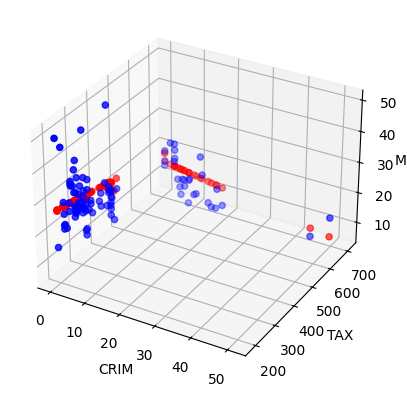

In [152]:
x, y = X_test1.values[:, 0], X_test1.values[:, 1]
z1, z2 = Y_test1.values[:, 0], Y_pred1[:, 0]

ax = plt.subplot(projection="3d")
ax.scatter(x, y, z1, color="b")
ax.scatter(x, y, z2, color="r")
ax.set_xlabel("CRIM")
ax.set_ylabel("TAX")
ax.set_zlabel("MEDV")
plt.show()